In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.basemap import Basemap


In [2]:
data = pd.read_csv("aws_flow_log_ex_large.csv", delimiter=";")
data

,timestamp,version,account-id,interface-id,srcaddr,dstaddr,srcport,dstport,protocol,packets,...,src_city,src_country,src_alpha2,src_lat,src_lng,dst_city,dst_country,dst_alpha2,dst_lat,dst_lng
0,1651356015000,2,738316572035,eni-0b94f7d040a6a5f37,162.142.125.181,172.30.0.129,43462,6605,6,1,...,Chicago,United States,US,41.8500,-87.6500,Dublin,Ireland,IE,53.3331,-6.2489
1,1651356015000,2,738316572035,eni-0b94f7d040a6a5f37,107.182.128.20,172.30.0.129,52980,81,6,1,...,New York City,United States,US,40.7143,-74.0060,Dublin,Ireland,IE,53.3331,-6.2489
2,1651356015000,2,738316572035,eni-0b94f7d040a6a5f37,52.218.108.88,172.30.0.129,80,50267,6,4,...,Dublin,Ireland,IE,53.3331,-6.2489,Dublin,Ireland,IE,53.3331,-6.2489
3,1651356015000,2,738316572035,eni-0b94f7d040a6a5f37,52.218.108.88,172.30.0.129,80,50268,6,6,...,Dublin,Ireland,IE,53.3331,-6.2489,Dublin,Ireland,IE,53.3331,-6.2489
4,1651356015000,2,738316572035,eni-0b94f7d040a6a5f37,172.30.0.129,52.218.108.88,50268,80,6,6,...,Dublin,Ireland,IE,53.3331,-6.2489,Dublin,Ireland,IE,53.3331,-6.2489
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1695,1651365555000,2,738316572035,eni-0b94f7d040a6a5f37,162.142.125.182,172.30.0.129,60251,3199,6,1,...,Chicago,United States,US,41.8500,-87.6500,Dublin,Ireland,IE,53.3331,-6.2489
1696,1651365555000,2,738316572035,eni-0b94f7d040a6a5f37,157.55.39.60,172.30.0.129,28992,80,6,9,...,Quincy,United States,US,47.2343,-119.8525,Dublin,Ireland,IE,53.3331,-6.2489
1697,1651365555000,2,738316572035,eni-0b94f7d040a6a5f37,207.46.13.106,172.30.0.129,16256,80,6,8,...,Quincy,United States,US,47.2343,-119.8525,Dublin,Ireland,IE,53.3331,-6.2489
1698,1651365555000,2,738316572035,eni-0b94f7d040a6a5f37,157.55.39.60,172.30.0.129,28993,80,6,7,...,Quincy,United States,US,47.2343,-119.8525,Dublin,Ireland,IE,53.3331,-6.2489


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1700 entries, 0 to 1699
Data columns (total 25 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   timestamp     1700 non-null   int64  
 1   version       1700 non-null   int64  
 2   account-id    1700 non-null   int64  
 3   interface-id  1700 non-null   object 
 4   srcaddr       1700 non-null   object 
 5   dstaddr       1700 non-null   object 
 6   srcport       1700 non-null   int64  
 7   dstport       1700 non-null   int64  
 8   protocol      1700 non-null   int64  
 9   packets       1700 non-null   int64  
 10  bytes         1700 non-null   int64  
 11  start         1700 non-null   int64  
 12  end           1700 non-null   int64  
 13  action        1700 non-null   object 
 14  log-status    1700 non-null   object 
 15  src_city      1700 non-null   object 
 16  src_country   1700 non-null   object 
 17  src_alpha2    1700 non-null   object 
 18  src_lat       1700 non-null 

In [4]:
data.isnull().sum()

timestamp       0
version         0
account-id      0
interface-id    0
srcaddr         0
dstaddr         0
srcport         0
dstport         0
protocol        0
packets         0
bytes           0
start           0
end             0
action          0
log-status      0
src_city        0
src_country     0
src_alpha2      0
src_lat         0
src_lng         0
dst_city        0
dst_country     0
dst_alpha2      0
dst_lat         0
dst_lng         0
dtype: int64

In [5]:
data.head()

,timestamp,version,account-id,interface-id,srcaddr,dstaddr,srcport,dstport,protocol,packets,...,src_city,src_country,src_alpha2,src_lat,src_lng,dst_city,dst_country,dst_alpha2,dst_lat,dst_lng
0,1651356015000,2,738316572035,eni-0b94f7d040a6a5f37,162.142.125.181,172.30.0.129,43462,6605,6,1,...,Chicago,United States,US,41.8500,-87.6500,Dublin,Ireland,IE,53.3331,-6.2489
1,1651356015000,2,738316572035,eni-0b94f7d040a6a5f37,107.182.128.20,172.30.0.129,52980,81,6,1,...,New York City,United States,US,40.7143,-74.0060,Dublin,Ireland,IE,53.3331,-6.2489
2,1651356015000,2,738316572035,eni-0b94f7d040a6a5f37,52.218.108.88,172.30.0.129,80,50267,6,4,...,Dublin,Ireland,IE,53.3331,-6.2489,Dublin,Ireland,IE,53.3331,-6.2489
3,1651356015000,2,738316572035,eni-0b94f7d040a6a5f37,52.218.108.88,172.30.0.129,80,50268,6,6,...,Dublin,Ireland,IE,53.3331,-6.2489,Dublin,Ireland,IE,53.3331,-6.2489
4,1651356015000,2,738316572035,eni-0b94f7d040a6a5f37,172.30.0.129,52.218.108.88,50268,80,6,6,...,Dublin,Ireland,IE,53.3331,-6.2489,Dublin,Ireland,IE,53.3331,-6.2489


In [6]:
data.tail()

,timestamp,version,account-id,interface-id,srcaddr,dstaddr,srcport,dstport,protocol,packets,...,src_city,src_country,src_alpha2,src_lat,src_lng,dst_city,dst_country,dst_alpha2,dst_lat,dst_lng
1695,1651365555000,2,738316572035,eni-0b94f7d040a6a5f37,162.142.125.182,172.30.0.129,60251,3199,6,1,...,Chicago,United States,US,41.8500,-87.6500,Dublin,Ireland,IE,53.3331,-6.2489
1696,1651365555000,2,738316572035,eni-0b94f7d040a6a5f37,157.55.39.60,172.30.0.129,28992,80,6,9,...,Quincy,United States,US,47.2343,-119.8525,Dublin,Ireland,IE,53.3331,-6.2489
1697,1651365555000,2,738316572035,eni-0b94f7d040a6a5f37,207.46.13.106,172.30.0.129,16256,80,6,8,...,Quincy,United States,US,47.2343,-119.8525,Dublin,Ireland,IE,53.3331,-6.2489
1698,1651365555000,2,738316572035,eni-0b94f7d040a6a5f37,157.55.39.60,172.30.0.129,28993,80,6,7,...,Quincy,United States,US,47.2343,-119.8525,Dublin,Ireland,IE,53.3331,-6.2489
1699,1651365555000,2,738316572035,eni-0b94f7d040a6a5f37,172.30.0.129,157.55.39.58,80,65280,6,4,...,Dublin,Ireland,IE,53.3331,-6.2489,Quincy,United States,US,47.2343,-119.8525


In [7]:
data.shape

(1700, 25)

In [8]:
data.describe()

,timestamp,version,account-id,srcport,dstport,protocol,packets,bytes,start,end,src_lat,src_lng,dst_lat,dst_lng
count,1.700000e+03,1700.0,1.700000e+03,1700.000000,1700.000000,1700.000000,1700.000000,1.700000e+03,1.700000e+03,1.700000e+03,1700.000000,1700.000000,1700.000000,1700.000000
mean,1.651361e+12,2.0,7.383166e+11,31605.317059,17588.571765,7.122353,4.265294,3.261219e+03,1.651361e+09,1.651361e+09,45.415404,-29.511827,51.615260,-20.195750
std,2.783935e+06,0.0,0.000000e+00,25200.373511,23153.903775,3.697393,48.714223,7.251335e+04,2.783935e+03,2.784923e+03,12.688921,65.188349,5.649765,41.448984
min,1.651356e+12,2.0,7.383166e+11,0.000000,0.000000,1.000000,1.000000,3.000000e+01,1.651356e+09,1.651356e+09,-35.426400,-122.714400,-35.426400,-122.714400
25%,1.651358e+12,2.0,7.383166e+11,443.000000,443.000000,6.000000,1.000000,4.200000e+01,1.651358e+09,1.651358e+09,41.850000,-87.650000,53.333100,-6.248900
50%,1.651361e+12,2.0,7.383166e+11,40504.000000,5555.000000,6.000000,1.000000,6.000000e+01,1.651361e+09,1.651361e+09,48.853400,-6.248900,53.333100,-6.248900
75%,1.651363e+12,2.0,7.383166e+11,52676.500000,33450.000000,6.000000,2.000000,1.103000e+03,1.651363e+09,1.651363e+09,53.333100,-3.180000,53.333100,-6.248900
max,1.651366e+12,2.0,7.383166e+11,65365.000000,65280.000000,47.000000,1920.000000,2.873128e+06,1.651366e+09,1.651366e+09,59.938600,151.207300,59.938600,127.328700


In [9]:
data.dtypes

timestamp         int64
version           int64
account-id        int64
interface-id     object
srcaddr          object
dstaddr          object
srcport           int64
dstport           int64
protocol          int64
packets           int64
bytes             int64
start             int64
end               int64
action           object
log-status       object
src_city         object
src_country      object
src_alpha2       object
src_lat         float64
src_lng         float64
dst_city         object
dst_country      object
dst_alpha2       object
dst_lat         float64
dst_lng         float64
dtype: object

In [10]:
data["bytes"].sum()

5544072

In [11]:
real_time_data = pd.to_datetime(data["timestamp"])
real_time_data

0      1970-01-01 00:27:31.356015
1      1970-01-01 00:27:31.356015
2      1970-01-01 00:27:31.356015
3      1970-01-01 00:27:31.356015
4      1970-01-01 00:27:31.356015
                  ...            
1695   1970-01-01 00:27:31.365555
1696   1970-01-01 00:27:31.365555
1697   1970-01-01 00:27:31.365555
1698   1970-01-01 00:27:31.365555
1699   1970-01-01 00:27:31.365555
Name: timestamp, Length: 1700, dtype: datetime64[ns]

Text(0, 0.5, 'Antal förekomna Action')

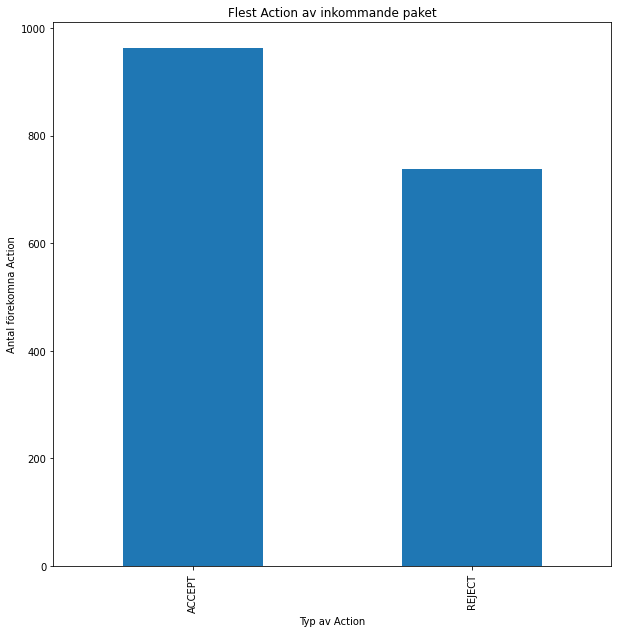

In [12]:
data["action"].value_counts()[:10].plot(kind="bar", figsize = (10,10))

plt.title("Flest Action av inkommande paket")
plt.xlabel("Typ av Action")
plt.ylabel("Antal förekomna Action")

Följande Protocol koder är ersatta utifrån IANA's webbplats: https://www.iana.org/assignments/protocol-numbers/protocol-numbers.xhtml

<AxesSubplot:>

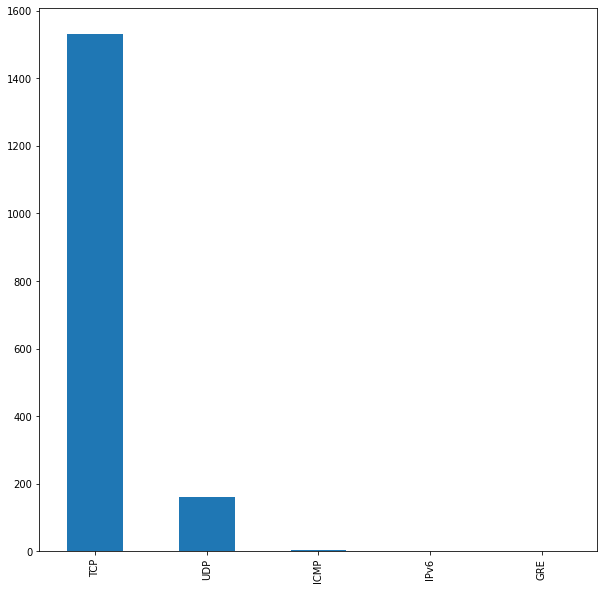

In [13]:
data.protocol = data.protocol.astype(str)

data.replace(to_replace = "6", value= "TCP", inplace= True)
data.replace(to_replace = "17", value= "UDP", inplace= True)
data.replace(to_replace = "1", value= "ICMP", inplace= True)
data.replace(to_replace = "41", value= "IPv6", inplace= True)
data.replace(to_replace = "47", value= "GRE", inplace= True)
#data

data["protocol"].value_counts()[:10].plot(kind="bar", figsize = (10,10))

Text(0, 0.5, 'Antal paket med IP-addressen')

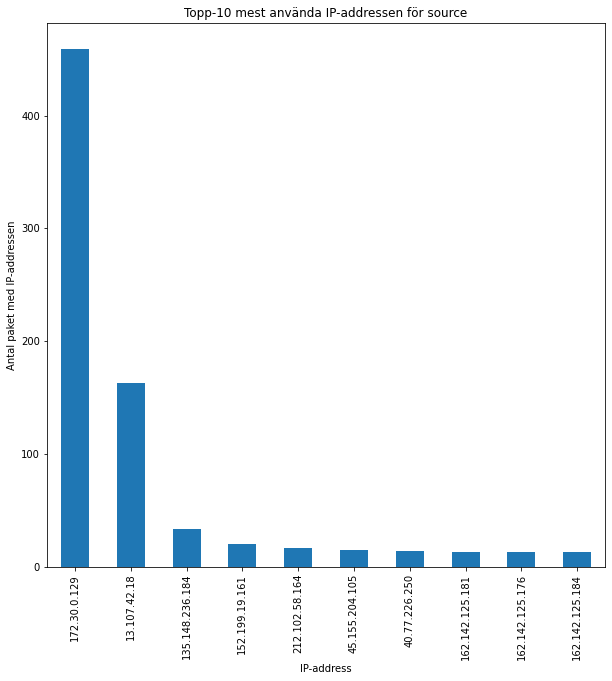

In [14]:
data["srcaddr"].value_counts()[:10].plot(kind="bar", figsize = (10,10))

plt.title("Topp-10 mest använda IP-addressen för source")
plt.xlabel("IP-address")
plt.ylabel("Antal paket med IP-addressen")

Text(0, 0.5, 'Antal paket med IP-addressen')

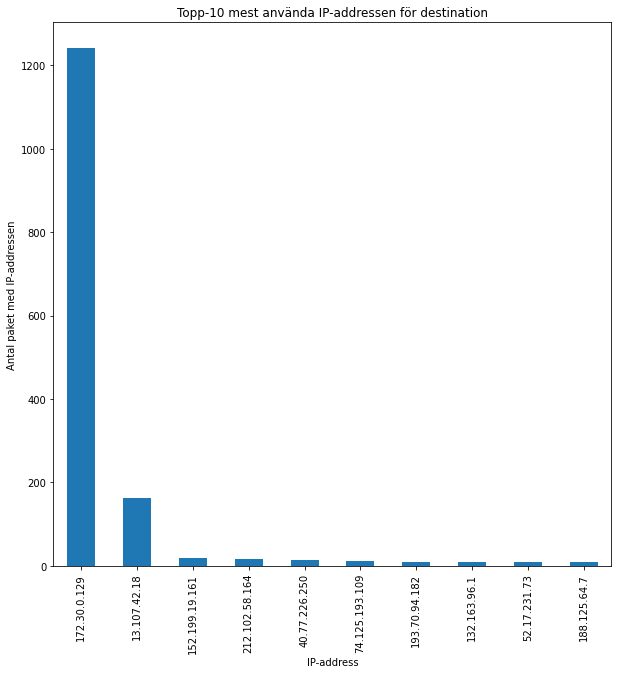

In [15]:
data["dstaddr"].value_counts()[:10].plot(kind="bar", figsize = (10,10))

plt.title("Topp-10 mest använda IP-addressen för destination")
plt.xlabel("IP-address")
plt.ylabel("Antal paket med IP-addressen")

Text(0, 0.5, 'Antal paket från Port')

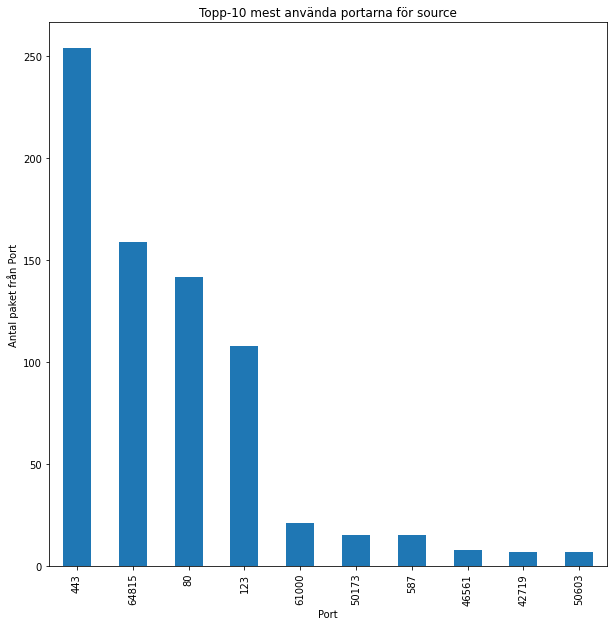

In [16]:
data["srcport"].value_counts()[:10].plot(kind="bar", figsize = (10,10))

plt.title("Topp-10 mest använda portarna för source")
plt.xlabel("Port")
plt.ylabel("Antal paket från Port")

Text(0, 0.5, 'Antal paket till Port')

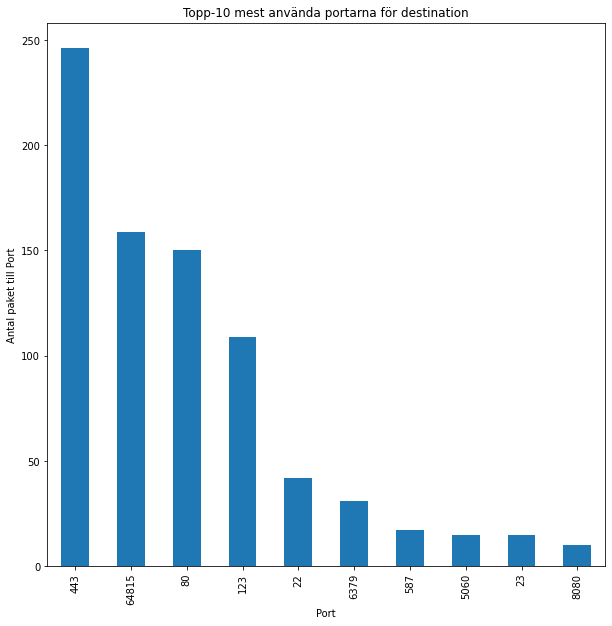

In [17]:
data["dstport"].value_counts()[:10].plot(kind="bar", figsize = (10,10))

plt.title("Topp-10 mest använda portarna för destination")
plt.xlabel("Port")
plt.ylabel("Antal paket till Port")

Text(0, 0.5, 'Andel paket till stad')

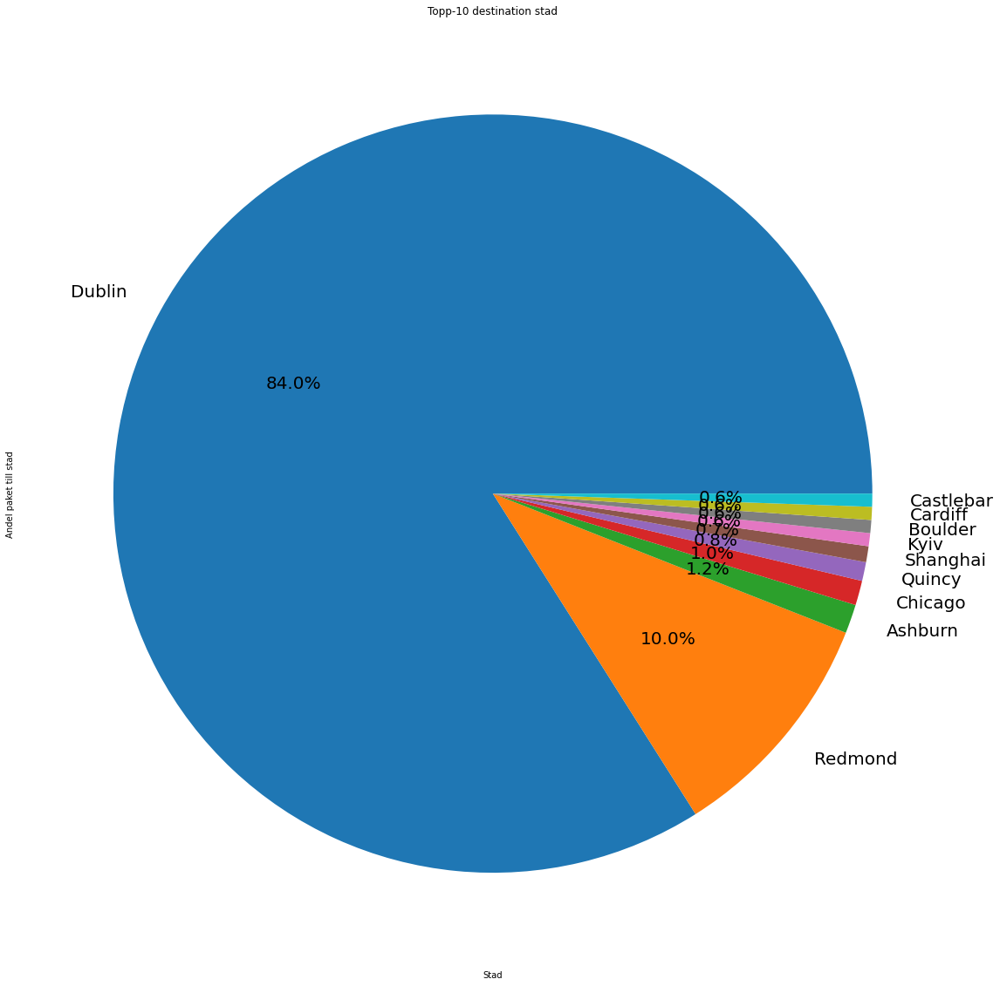

In [18]:
data["dst_city"].value_counts()[:10].plot(kind="pie", figsize = (20,20), autopct = "%.1f%%", fontsize = 20)

plt.title("Topp-10 destination stad")
plt.xlabel("Stad")
plt.ylabel("Andel paket till stad")

Text(0, 0.5, 'Antal paket till stad')

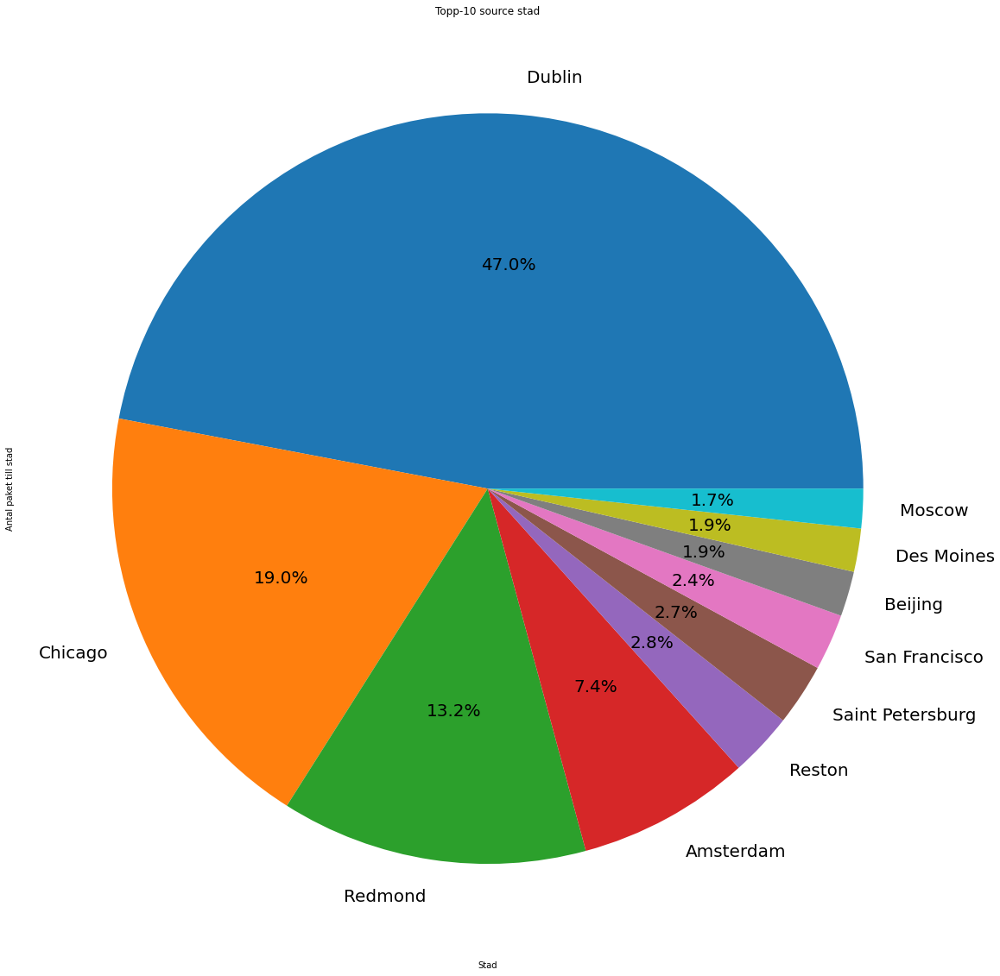

In [19]:
data["src_city"].value_counts()[:10].plot(kind="pie", figsize = (20,20), autopct = "%.1f%%", fontsize = 20)

plt.title("Topp-10 source stad")
plt.xlabel("Stad")
plt.ylabel("Antal paket till stad")

Text(0, 0.5, 'Antal paket till land')

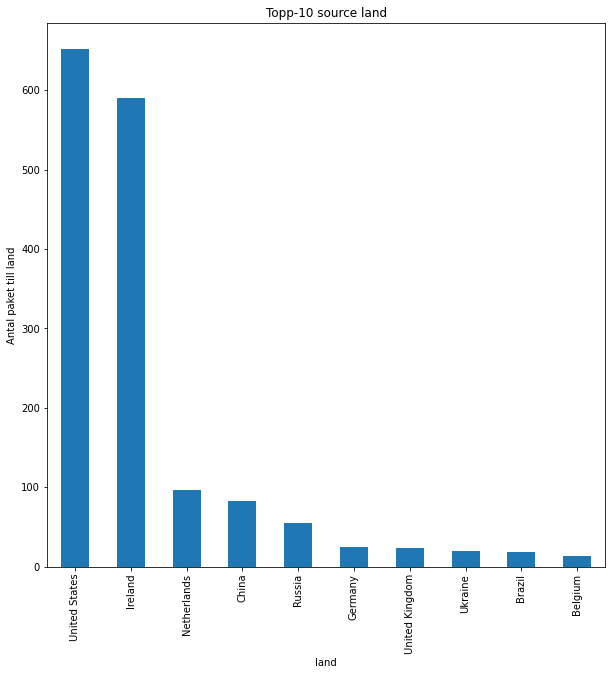

In [20]:
data["src_country"].value_counts()[:10].plot(kind="bar", figsize = (10,10))

plt.title("Topp-10 source land")
plt.xlabel("land")
plt.ylabel("Antal paket till land")

Text(0, 0.5, 'Antal paket till land')

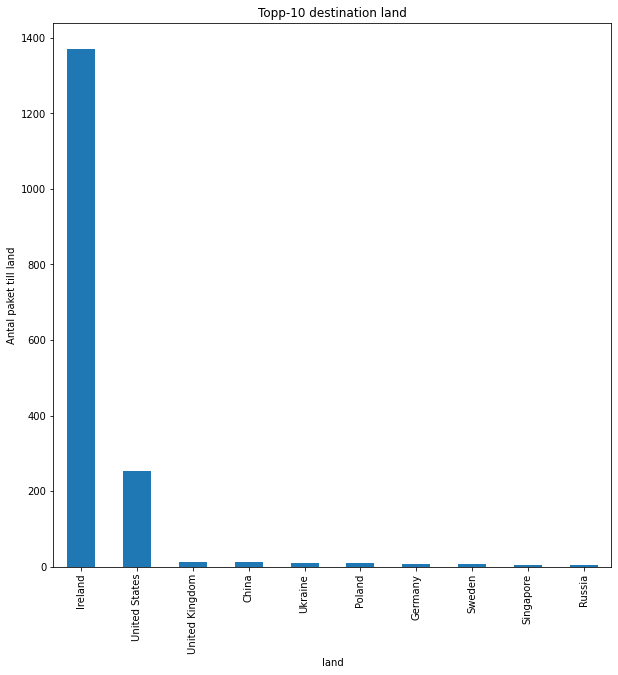

In [21]:
data["dst_country"].value_counts()[:10].plot(kind="bar", figsize = (10,10))

plt.title("Topp-10 destination land")
plt.xlabel("land")
plt.ylabel("Antal paket till land")

<function matplotlib.pyplot.show(close=None, block=None)>

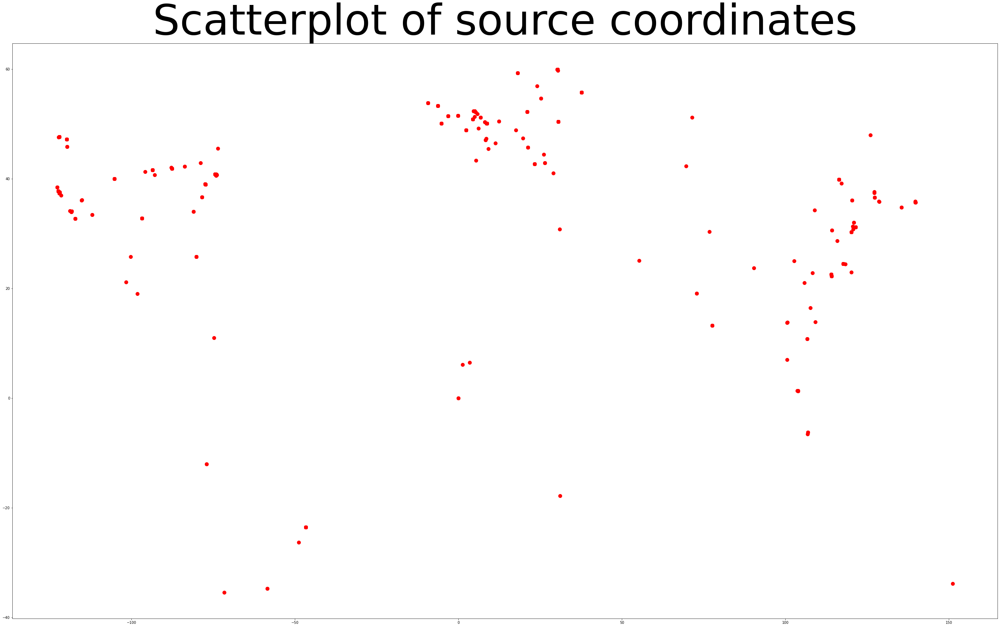

In [22]:
fig = plt.figure(figsize=(50,30))
sites_lon_x = data["src_lng"]
sites_lat_y = data["src_lat"]

plt.scatter(sites_lon_x, sites_lat_y, s=100, c="red" )

plt.title("Scatterplot of source coordinates", fontsize = 120)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

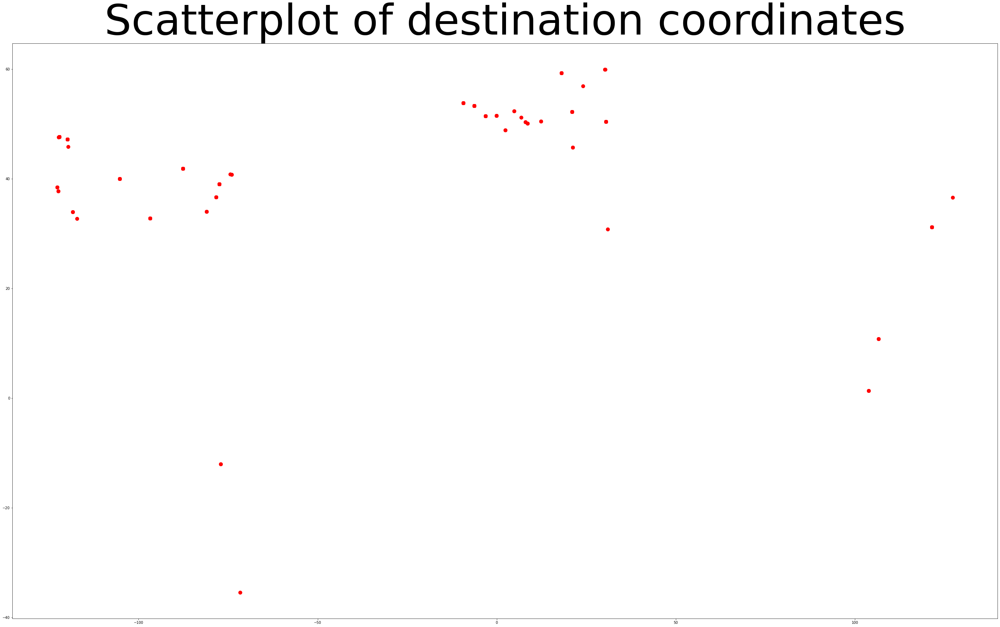

In [32]:
fig = plt.figure(figsize=(50,30))
sites_lon_x = data["dst_lng"]
sites_lat_y = data["dst_lat"]

plt.scatter(sites_lon_x, sites_lat_y, s=100, c="red" )

plt.title("Scatterplot of destination coordinates", fontsize = 120)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

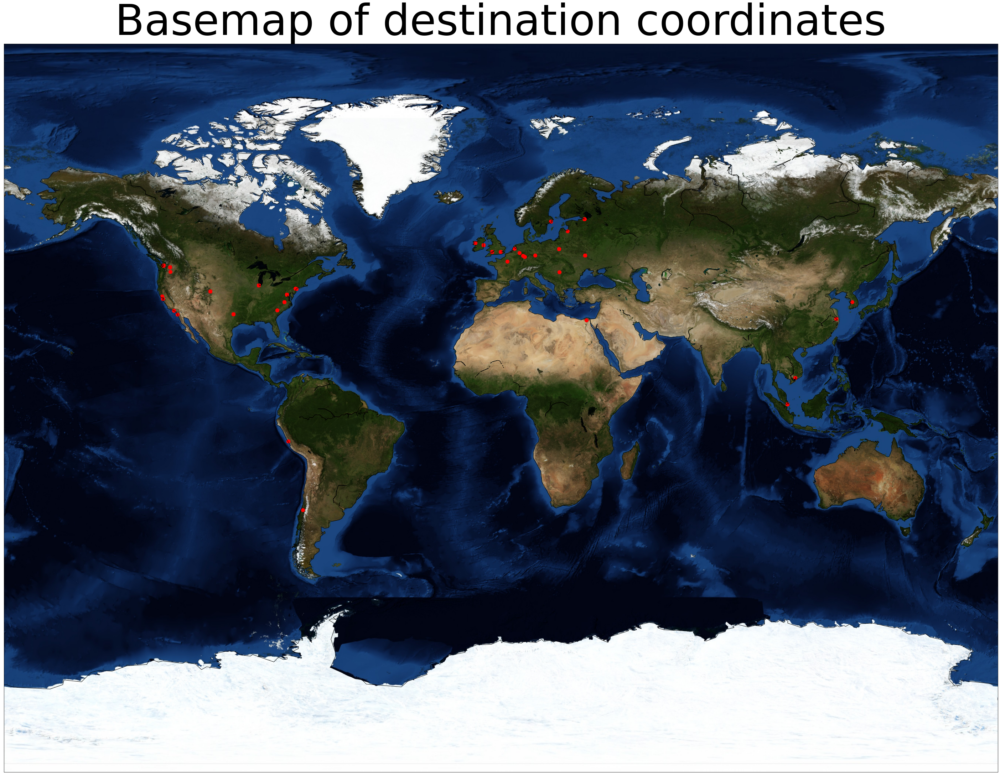

In [24]:
fig = plt.figure(figsize=(50,70))

m = Basemap(projection="mill",
            llcrnrlat= -90,
            urcrnrlat= 90,
            llcrnrlon= -180,
            urcrnrlon= 180)

m.drawcoastlines()
m.bluemarble()


sites_lon_x = data["dst_lng"]
sites_lat_y = data["dst_lat"]

m.scatter(sites_lon_x, sites_lat_y, latlon = True, s=100, c="red" )

plt.title("Basemap of destination coordinates", fontsize = 120)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

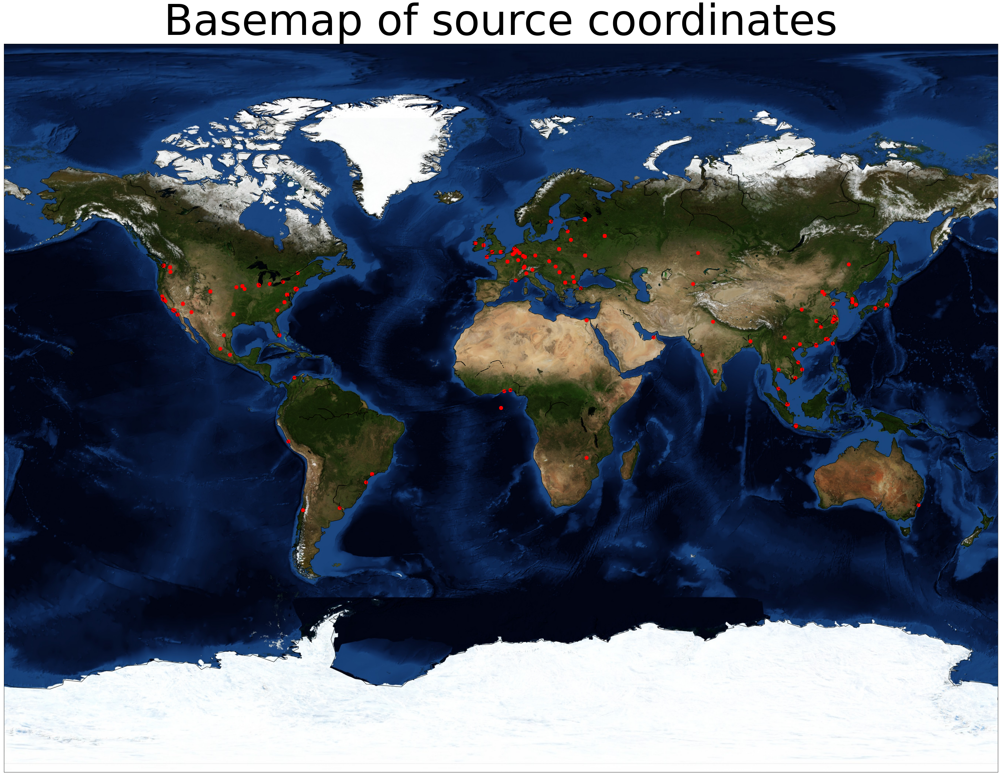

In [25]:
fig = plt.figure(figsize=(50,70))

m = Basemap(projection="mill",
            llcrnrlat= -90,
            urcrnrlat= 90,
            llcrnrlon= -180,
            urcrnrlon= 180)

m.drawcoastlines()
m.bluemarble()


sites_lon_x = data["src_lng"]
sites_lat_y = data["src_lat"]

m.scatter(sites_lon_x, sites_lat_y, latlon = True, s=100, c="red" )

plt.title("Basemap of source coordinates", fontsize = 120)
plt.show

<AxesSubplot:>

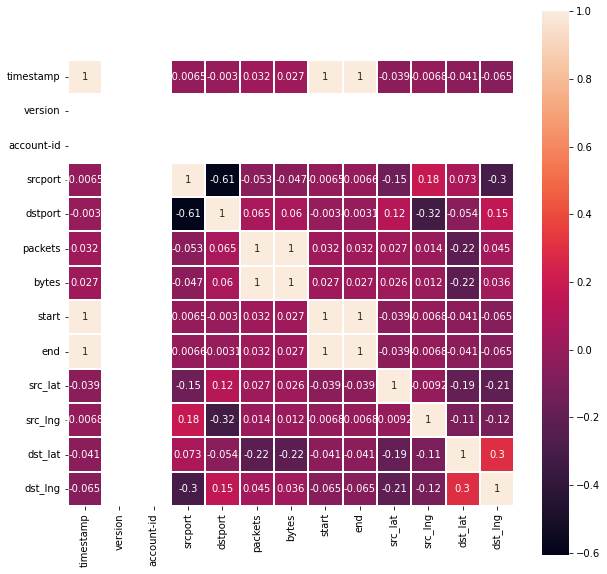

In [26]:
corr = data.corr()

plt.figure(figsize =(10,10))
sns.heatmap(corr,annot=True,linewidths=0.01,vmax=1,square=True,cbar=True )

Text(0, 0.5, 'Antal paket med UDP-protocol')

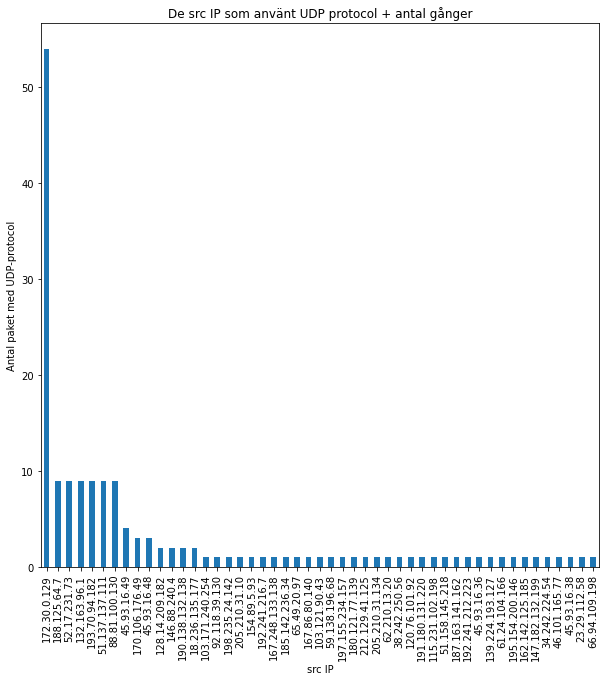

In [27]:
new_data = data[data.protocol == "UDP"]

new_data["srcaddr"].value_counts().plot(kind= "bar", figsize=(10,10))

plt.title("De src IP som använt UDP protocol + antal gånger")
plt.xlabel("src IP")
plt.ylabel("Antal paket med UDP-protocol")

Text(0, 0.5, "Antal 'reject' paket")

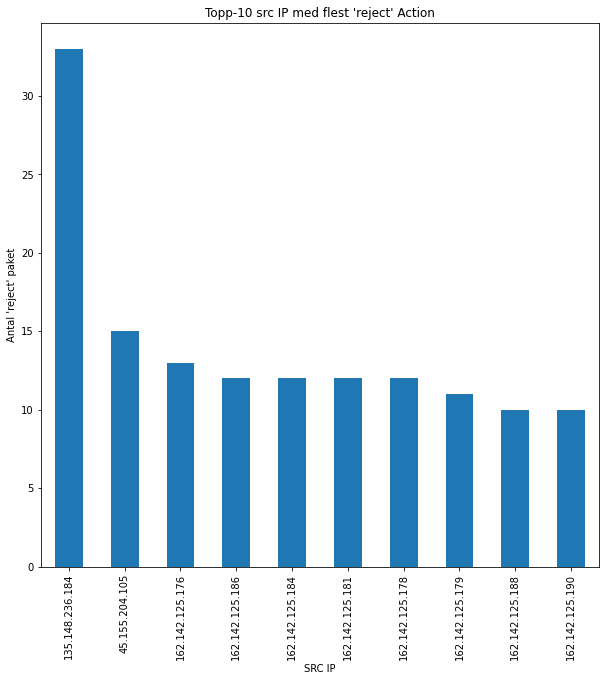

In [28]:
new_data = data[data.action == "REJECT"]

new_data["srcaddr"].value_counts()[:10].plot(kind= "bar", figsize=(10,10))

plt.title("Topp-10 src IP med flest 'reject' Action")
plt.xlabel("SRC IP")
plt.ylabel("Antal 'reject' paket")

Text(0, 0.5, "Antal 'reject' paket")

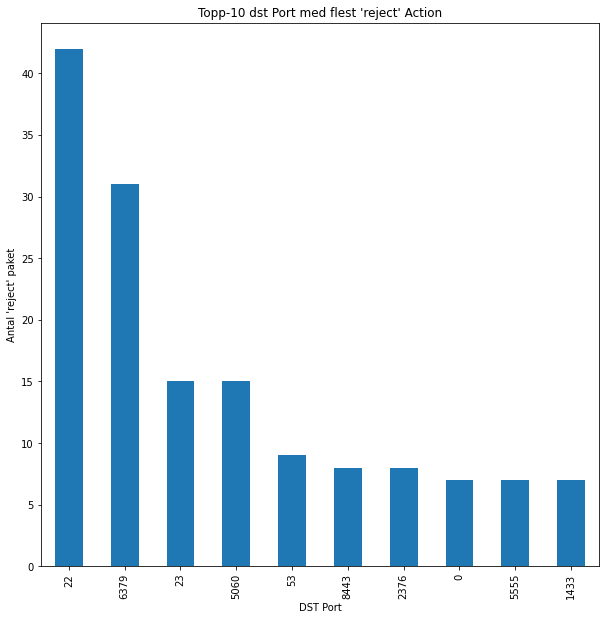

In [29]:
new_data["dstport"].value_counts()[:10].plot(kind= "bar", figsize=(10,10))

plt.title("Topp-10 dst Port med flest 'reject' Action")
plt.xlabel("DST Port")
plt.ylabel("Antal 'reject' paket")

Text(0, 0.5, "Antal 'reject' paket")

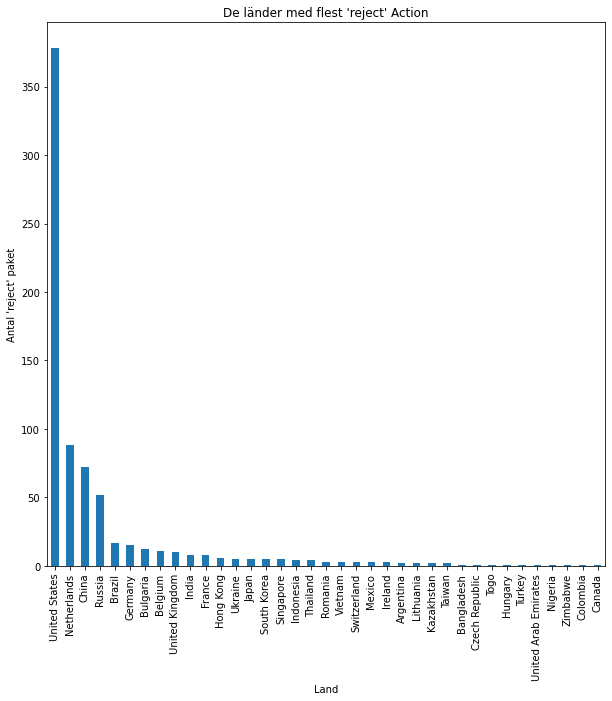

In [30]:
new_data = data[data.action == "REJECT"]

new_data["src_country"].value_counts().plot(kind= "bar", figsize=(10,10))

plt.title("De länder med flest 'reject' Action")
plt.xlabel("Land")
plt.ylabel("Antal 'reject' paket")

Text(0, 0.5, "Antal 'reject' paket")

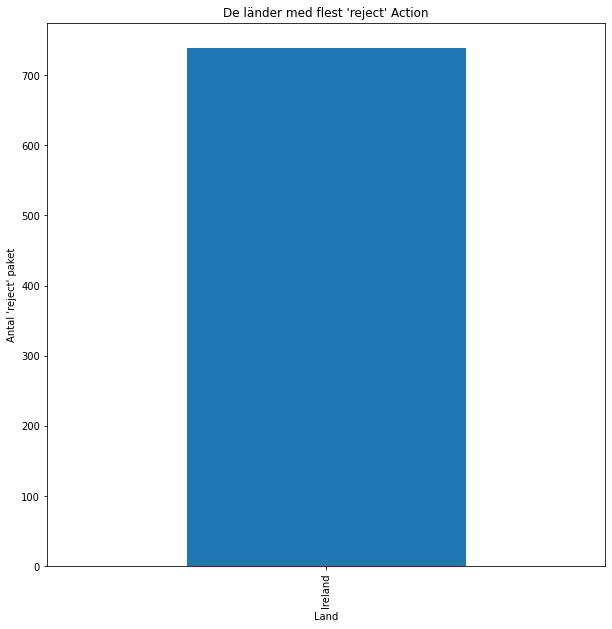

In [31]:
new_data = data[data.action == "REJECT"]

new_data["dst_country"].value_counts().plot(kind= "bar", figsize=(10,10))

plt.title("De länder med flest 'reject' Action")
plt.xlabel("Land")
plt.ylabel("Antal 'reject' paket")